In [4]:
!nvidia-smi

Sat Nov 22 19:46:26 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="UYSQN1vnvUTCaRqMNQuv")
project = rf.workspace("european-university-of-bangladesh").project("bangladeshi-vehicles-license-plate")
version = project.version(2)
dataset = version.download("yolov11")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 31.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 39.7 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 70.5 MB/s eta 0:00:00:00:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 3.6.0 requires fsspec[http]<=2025.3.


Extracting Dataset Version Zip to Bangladeshi-Vehicles-License-Plate-2 in yolov11:: 100%|██████████| 2892/2892 [00:00<00:00, 7899.04it/s]


In [6]:
!cat /kaggle/working/Bangladeshi-Vehicles-License-Plate-2/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['License-Plate']

roboflow:
  workspace: european-university-of-bangladesh
  project: bangladeshi-vehicles-license-plate
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/european-university-of-bangladesh/bangladeshi-vehicles-license-plate/dataset/2

In [7]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 8.4 MB/s eta 0:00:000:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found exi

In [8]:
!yolo detect train data=/kaggle/working/Bangladeshi-Vehicles-License-Plate-2/data.yaml model=yolov8s.pt epochs=60 imgsz=600

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.230 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/Bangladeshi-Vehicles-License-Plate-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz

In [9]:
!ls /kaggle/working/runs/detect/train

args.yaml			 results.csv	      val_batch0_labels.jpg
BoxF1_curve.png			 results.png	      val_batch0_pred.jpg
BoxP_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
BoxPR_curve.png			 train_batch1.jpg     val_batch1_pred.jpg
BoxR_curve.png			 train_batch2.jpg     val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch3150.jpg  val_batch2_pred.jpg
confusion_matrix.png		 train_batch3151.jpg  weights
labels.jpg			 train_batch3152.jpg


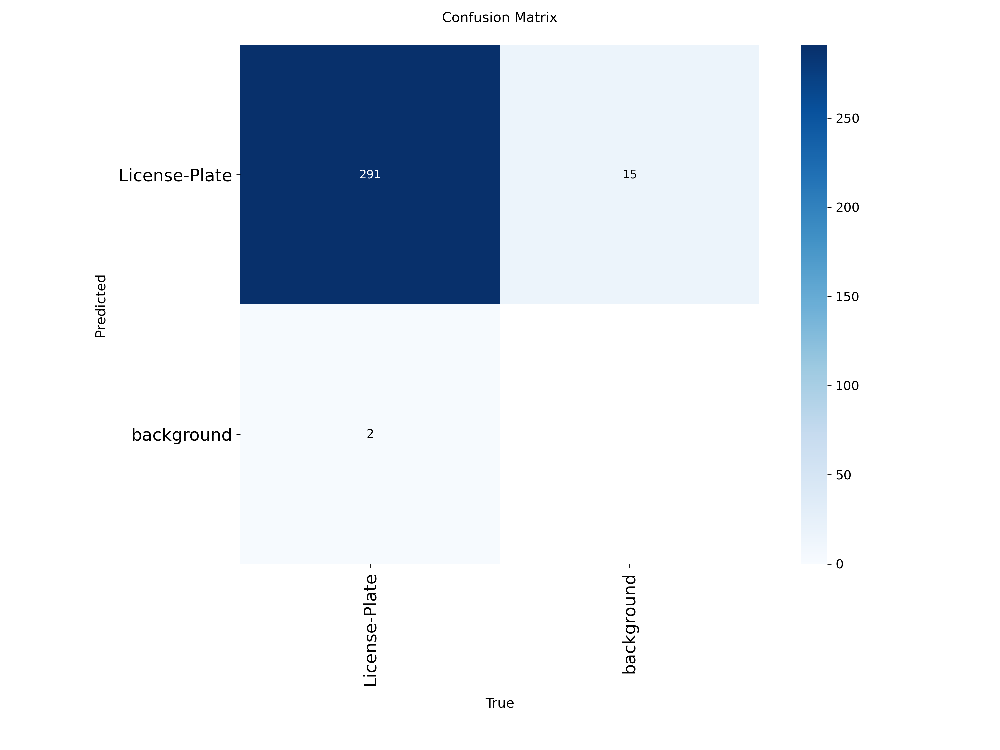

In [10]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'/kaggle/working/runs/detect/train/confusion_matrix.png', width=600)

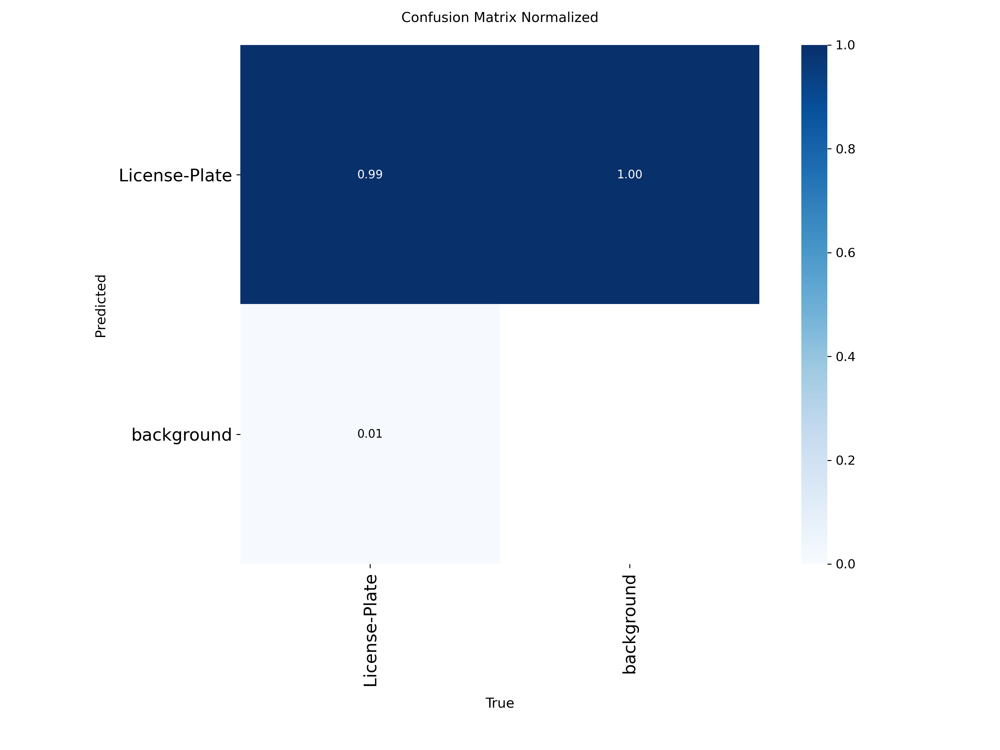

In [30]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'/kaggle/working/runs/detect/train/confusion_matrix_normalized.png', width=600)

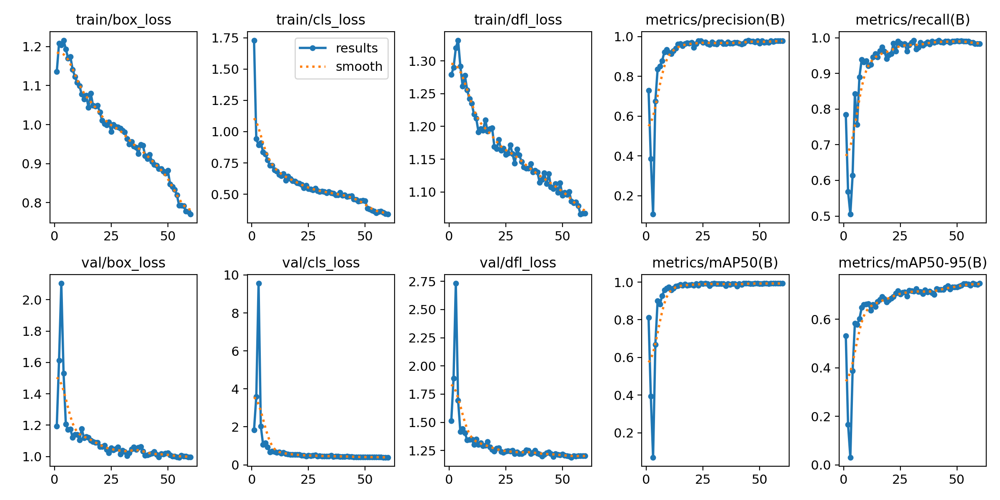

In [11]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'/kaggle/working/runs/detect/train/results.png', width=600)

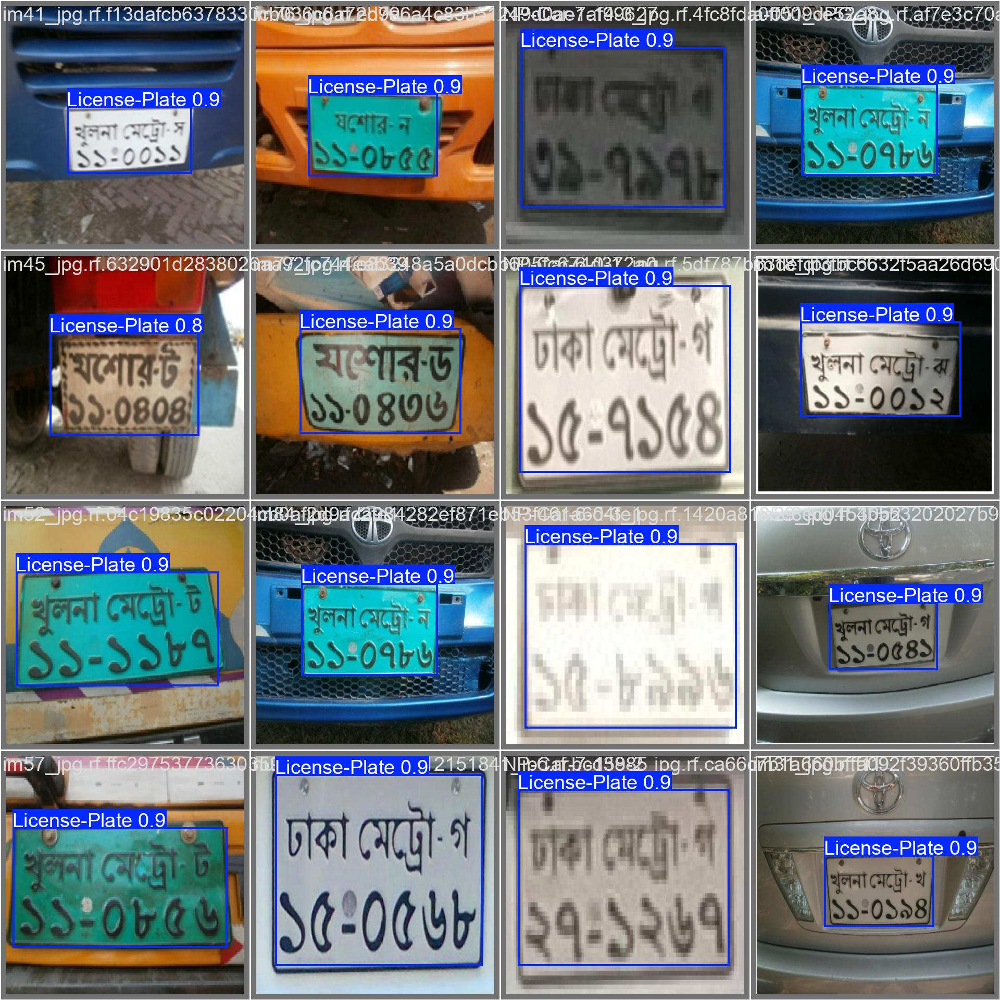

In [12]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'/kaggle/working/runs/detect/train/val_batch0_pred.jpg', width=600)

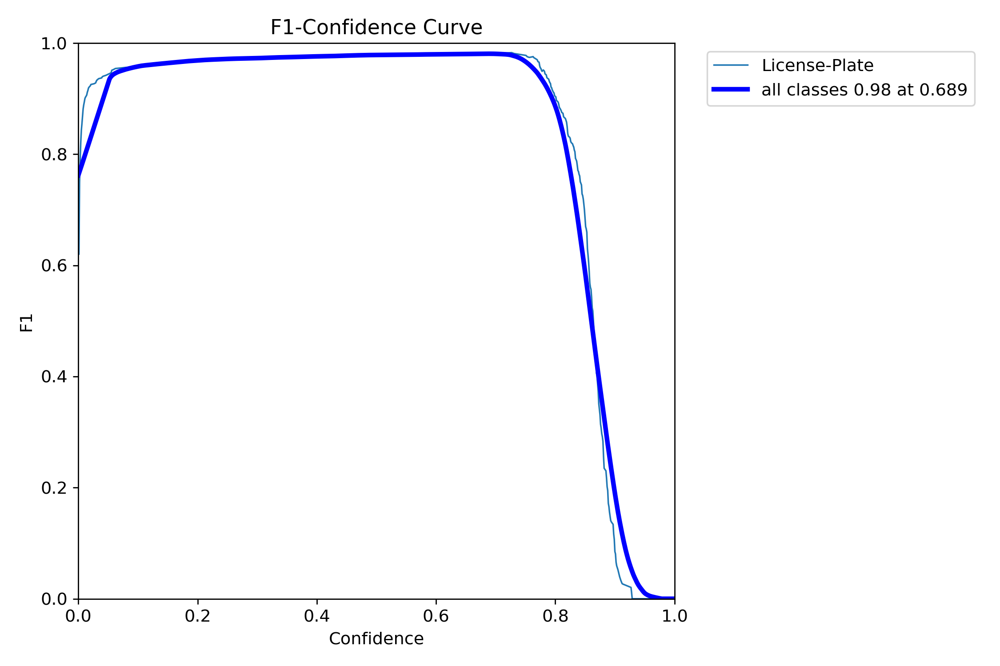

In [13]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'/kaggle/working/runs/detect/train/BoxF1_curve.png', width=600)

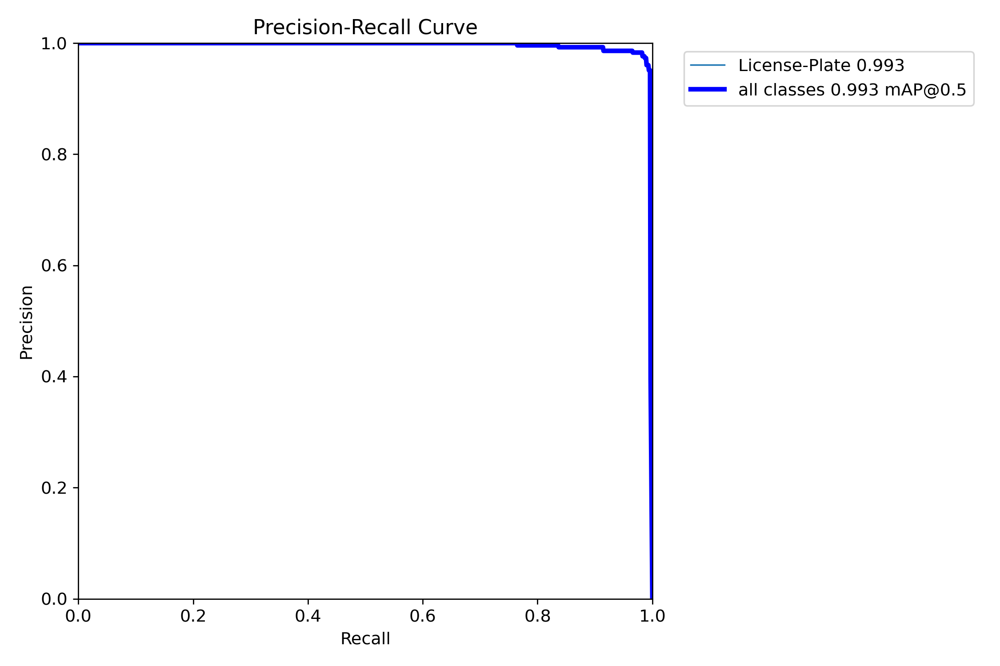

In [31]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'/kaggle/working/runs/detect/train/BoxPR_curve.png', width=600)

# Validate fine-tuned model

In [14]:
!yolo task=detect mode=val model=/kaggle/working/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.230 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1348.5±519.7 MB/s, size: 39.9 KB)
val: Scanning /kaggle/working/Bangladeshi-Vehicles-License-Plate-2/valid/labels.cache... 288 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 288/288 5.1Mit/s 0.0ss
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 26, len(boxes) = 293. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 4.2it/s 4.3s0.2s
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplot

In [15]:
!yolo task=detect mode=val model=/kaggle/working/runs/detect/train/weights/best.pt data=/kaggle/working/Bangladeshi-Vehicles-License-Plate-2/data.yaml

Ultralytics 8.3.230 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1490.4±508.7 MB/s, size: 49.3 KB)
val: Scanning /kaggle/working/Bangladeshi-Vehicles-License-Plate-2/valid/labels.cache... 288 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 288/288 5.2Mit/s 0.0ss
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 26, len(boxes) = 293. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 4.2it/s 4.3s0.2s
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplot

# Upload test images for testing

In [16]:
!pip install gdown

In [17]:
!gdown --folder https://drive.google.com/drive/folders/1LfdAnkJlVRqEQCUmpl3C9ljUWLF-wE8f -O /kaggle/working/

Retrieving folder contents
Processing file 1H-6zL2758FeM1uXgKvn5YbxpvOpn9-WQ test_image.jpg
Processing file 14CT1jG6ncItqoLNRFMVEJ2R2E5rbksBv test_image2.jpg
Processing file 1LPX1guEQ6WX53c1FR7aCkOL4bPZ6JguL test_image3.jpg
Processing file 1HrmHIPJpu07XvLSJnBlVulPcJanK_cfB test_image4.jpg
Processing file 10i_htUksqIx46VgFrs9X2aapTr_02NUU test_image5.jpg
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1H-6zL2758FeM1uXgKvn5YbxpvOpn9-WQ
To: /kaggle/working/test_image/test_image.jpg
100%|██████████████████████████████████████| 3.47M/3.47M [00:00<00:00, 21.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=14CT1jG6ncItqoLNRFMVEJ2R2E5rbksBv
To: /kaggle/working/test_image/test_image2.jpg
100%|██████████████████████████████████████| 5.21M/5.21M [00:00<00:00, 21.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1LPX1guEQ6WX53c1FR7aCkOL4bPZ6JguL
To: /kaggle/working/test_i

In [18]:
!ls /kaggle/working/test_image

test_image2.jpg  test_image4.jpg  test_image.jpg
test_image3.jpg  test_image5.jpg


# Inference with custom model

In [19]:
#Step 1: Run Prediction
!yolo detect predict model=/kaggle/working/runs/detect/train/weights/best.pt source=/kaggle/working/test_image/test_image.jpg save=True

Ultralytics 8.3.230 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

image 1/1 /kaggle/working/test_image/test_image.jpg: 608x480 1 License-Plate, 42.6ms
Speed: 3.0ms preprocess, 42.6ms inference, 2.1ms postprocess per image at shape (1, 3, 608, 480)
Results saved to /kaggle/working/runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


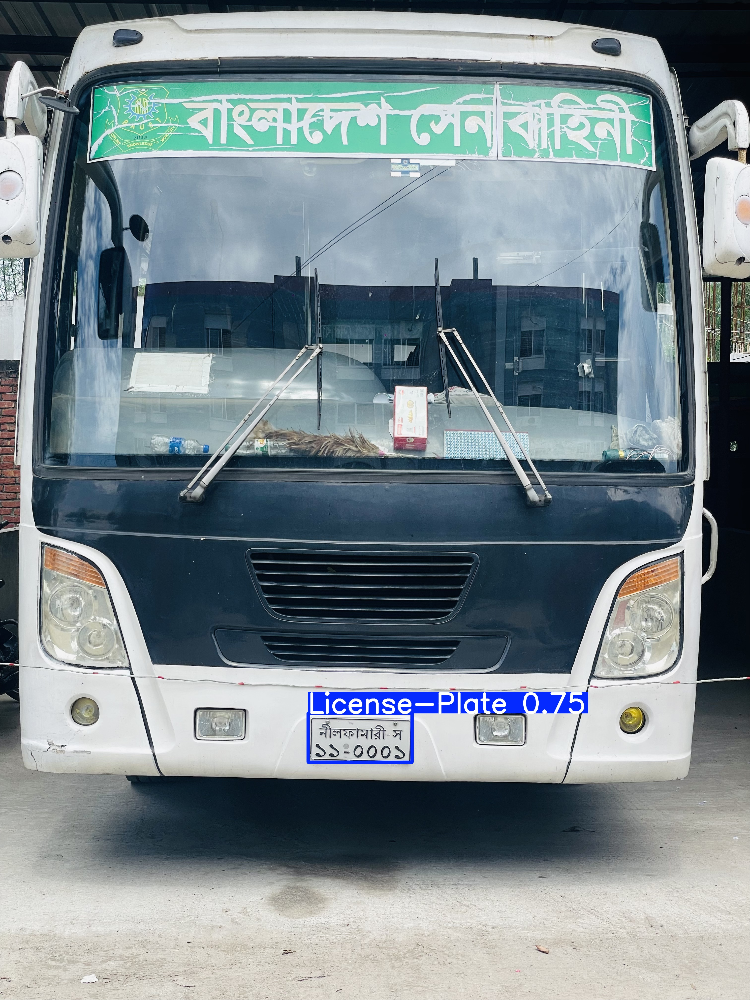

In [20]:
#Step 2: Display the Resulting Predicted Image(s)
import glob
import os
from IPython.display import Image as IPyImage, display

# Define path to latest prediction folder
predict_folders = glob.glob('/kaggle/working/runs/detect/predict*/')
latest_folder = max(predict_folders, key=os.path.getmtime)

# Display up to 3 prediction images
for img_path in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img_path, width=600))
    print("\n")


In [21]:
#Step 1: Run Prediction
!yolo detect predict model=/kaggle/working/runs/detect/train/weights/best.pt source=/kaggle/working/test_image/test_image2.jpg save=True

Ultralytics 8.3.230 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

image 1/1 /kaggle/working/test_image/test_image2.jpg: 608x480 1 License-Plate, 40.4ms
Speed: 4.4ms preprocess, 40.4ms inference, 2.0ms postprocess per image at shape (1, 3, 608, 480)
Results saved to /kaggle/working/runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


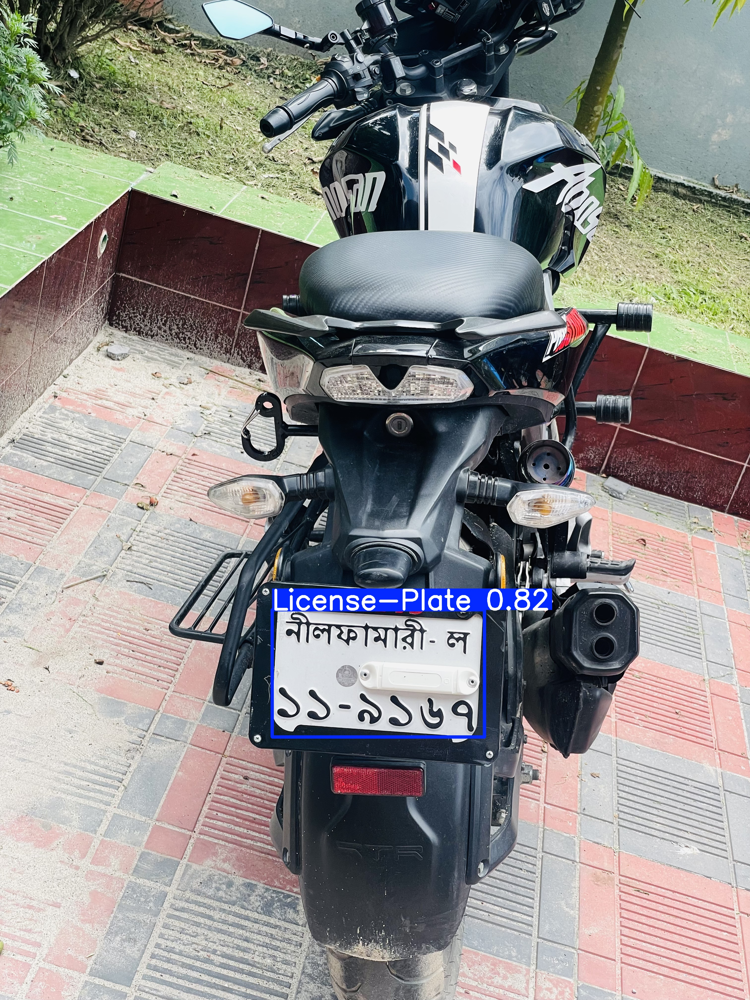

In [22]:
#Step 2: Display the Resulting Predicted Image(s)
import glob
import os
from IPython.display import Image as IPyImage, display

# Define path to latest prediction folder
predict_folders = glob.glob('/kaggle/working/runs/detect/predict*/')
latest_folder = max(predict_folders, key=os.path.getmtime)

# Display up to 3 prediction images
for img_path in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img_path, width=600))
    print("\n")


In [23]:
#Step 1: Run Prediction
!yolo detect predict model=/kaggle/working/runs/detect/train/weights/best.pt source=/kaggle/working/test_image/test_image3.jpg save=True

Ultralytics 8.3.230 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

image 1/1 /kaggle/working/test_image/test_image3.jpg: 608x480 1 License-Plate, 43.3ms
Speed: 4.8ms preprocess, 43.3ms inference, 2.0ms postprocess per image at shape (1, 3, 608, 480)
Results saved to /kaggle/working/runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


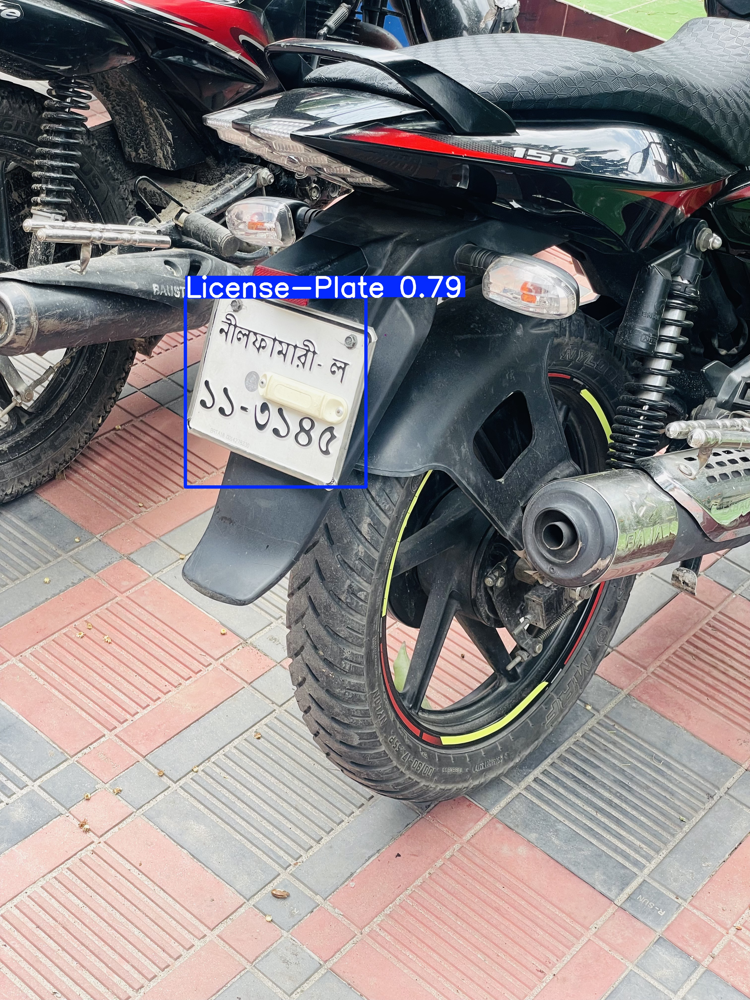

In [24]:
#Step 2: Display the Resulting Predicted Image(s)
import glob
import os
from IPython.display import Image as IPyImage, display

# Define path to latest prediction folder
predict_folders = glob.glob('/kaggle/working/runs/detect/predict*/')
latest_folder = max(predict_folders, key=os.path.getmtime)

# Display up to 3 prediction images
for img_path in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img_path, width=600))
    print("\n")


# Download YOLO Model

In [25]:
# Create "my_model" folder in Kaggle working directory
!mkdir /kaggle/working/my_model

# Copy best.pt and training folder to "my_model"
!cp /kaggle/working/runs/detect/train/weights/best.pt /kaggle/working/my_model/my_model.pt
!cp -r /kaggle/working/runs/detect/train /kaggle/working/my_model/

# Change to the my_model directory
%cd /kaggle/working/my_model

# Zip the model weights and training folder
!zip -r /kaggle/working/my_model.zip .

# Go back to working directory
%cd /kaggle/working


/kaggle/working/my_model
  adding: my_model.pt (deflated 8%)
  adding: train/ (stored 0%)
  adding: train/val_batch1_labels.jpg (deflated 11%)
  adding: train/args.yaml (deflated 52%)
  adding: train/train_batch1.jpg (deflated 3%)
  adding: train/train_batch3152.jpg (deflated 6%)
  adding: train/train_batch3150.jpg (deflated 8%)
  adding: train/results.csv (deflated 61%)
  adding: train/results.png (deflated 8%)
  adding: train/train_batch2.jpg (deflated 2%)
  adding: train/BoxPR_curve.png (deflated 29%)
  adding: train/train_batch3151.jpg (deflated 10%)
  adding: train/BoxP_curve.png (deflated 23%)
  adding: train/confusion_matrix.png (deflated 36%)
  adding: train/val_batch2_labels.jpg (deflated 8%)
  adding: train/BoxR_curve.png (deflated 17%)
  adding: train/val_batch2_pred.jpg (deflated 8%)
  adding: train/BoxF1_curve.png (deflated 16%)
  adding: train/val_batch0_labels.jpg (deflated 10%)
  adding: train/weights/ (stored 0%)
  adding: train/weights/last.pt (deflated 8%)
  adding: 

In [26]:
!zip -r /kaggle/working/my_model.zip /kaggle/working/my_model


  adding: kaggle/working/my_model/ (stored 0%)
  adding: kaggle/working/my_model/my_model.pt (deflated 8%)
  adding: kaggle/working/my_model/train/ (stored 0%)
  adding: kaggle/working/my_model/train/val_batch1_labels.jpg (deflated 11%)
  adding: kaggle/working/my_model/train/args.yaml (deflated 52%)
  adding: kaggle/working/my_model/train/train_batch1.jpg (deflated 3%)
  adding: kaggle/working/my_model/train/train_batch3152.jpg (deflated 6%)
  adding: kaggle/working/my_model/train/train_batch3150.jpg (deflated 8%)
  adding: kaggle/working/my_model/train/results.csv (deflated 61%)
  adding: kaggle/working/my_model/train/results.png (deflated 8%)
  adding: kaggle/working/my_model/train/train_batch2.jpg (deflated 2%)
  adding: kaggle/working/my_model/train/BoxPR_curve.png (deflated 29%)
  adding: kaggle/working/my_model/train/train_batch3151.jpg (deflated 10%)
  adding: kaggle/working/my_model/train/BoxP_curve.png (deflated 23%)
  adding: kaggle/working/my_model/train/confusion_matrix.pn

In [27]:
%cd /kaggle/working/my_model
!ls -l

/kaggle/working/my_model
total 21992
-rw-r--r-- 1 root root 22513507 Nov 22 20:07 my_model.pt
drwxr-xr-x 3 root root     4096 Nov 22 20:07 train
